<a href="https://colab.research.google.com/github/11SyamSM/amikom/blob/main/MatchingV2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#uninstall open cv bawaan
!pip uninstall opencv-python -y

Found existing installation: opencv-python 4.7.0.72
Uninstalling opencv-python-4.7.0.72:
  Successfully uninstalled opencv-python-4.7.0.72


In [ ]:
#downgrade open cv agar bisa menggunakan shift
!pip install opencv-contrib-python==3.4.17.61 --force-reinstall


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.2/63.2 MB 8.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 21.7 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 1.22.4
    Uninstalling numpy-1.22.4:
      Successfully uninstalled numpy-1.22.4
  Attempting uninstall: opencv-contrib-python
    Found existing installation: opencv-contrib-python 4.7.0.72
    Uninstalling opencv-contrib-python-4.7.0.72:
      Successfully uninstalled opencv-contrib-python-4.7.0.72
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
imgaug 0.4.0 requires opencv-python, which is not installed.
dopamine-rl 4.0.6 requires opencv-python>=3.4.8.29, which is not installed.
numba 0.56.4 requires numpy<1.24,>=1.18, but you have nu

In [ ]:
#import library yang akan digunakan

import numpy as np
import cv2
from matplotlib import pyplot as plt
from google.colab.patches import cv2_imshow
figsize = (20,20) 

In [ ]:
img=cv2.imread ('/content/drive/MyDrive/CV - Computer Vision/gd72.jpg')
img2=cv2.imread ('/content/drive/MyDrive/CV - Computer Vision/gd71.jpg')

#resize
skala = 25

#mengukur skala dgn yg asli
lebar=int(img.shape[1]*skala/100)
panjang=int(img.shape[0]*skala/100)
lebar2=int(img2.shape[1]*skala/100)
panjang2=int(img2.shape[0]*skala/100)

ukuran=(lebar,panjang)
ukuran2=(lebar,panjang)

#HASIL
imresize=cv2.resize(img,ukuran)
imresize2=cv2.resize(img2,ukuran2)

rgb=cv2.cvtColor(imresize,cv2.COLOR_BGR2RGB)
rgb2=cv2.cvtColor(imresize2,cv2.COLOR_BGR2RGB)

abu=cv2.cvtColor(rgb,cv2.COLOR_BGR2GRAY)
abu2=cv2.cvtColor(rgb2,cv2.COLOR_BGR2GRAY)


jumlah titik terdeteksi=  3791
jumlah titik terdeteksi2=  2935


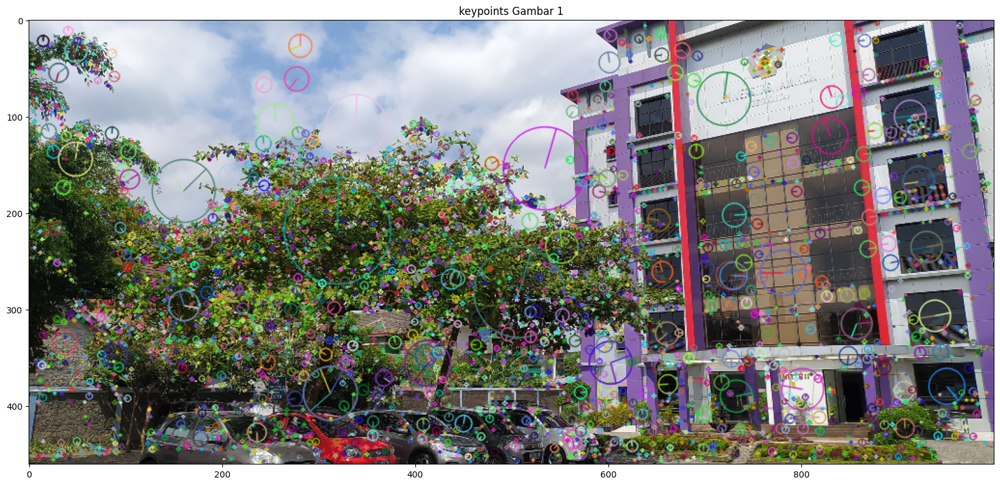

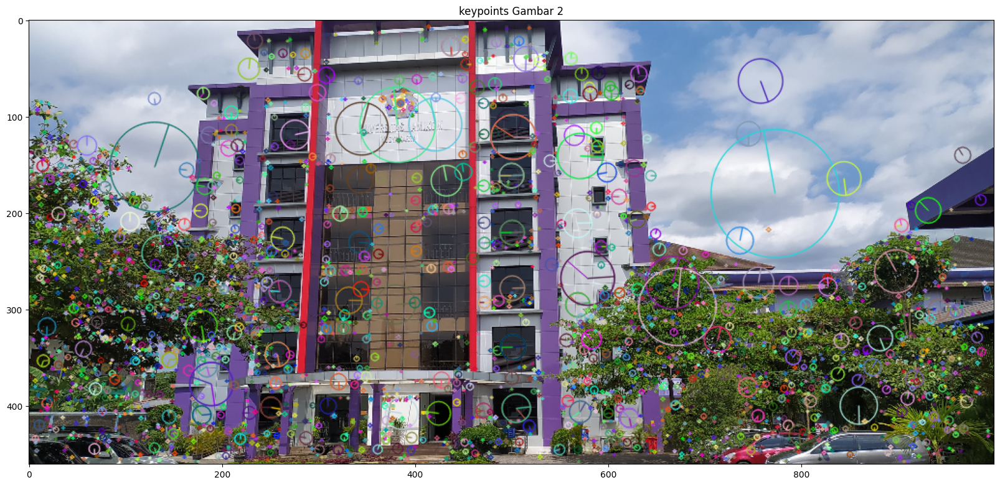

In [ ]:
#Menghitung feature dengan SHIFT
sift = cv2.xfeatures2d.SIFT_create()
kp, des = sift.detectAndCompute(abu, None)
kp2, des2 = sift.detectAndCompute(abu2, None)

#berapa jumlah titik terdeteksi?
print("jumlah titik terdeteksi= ", len(kp))
print("jumlah titik terdeteksi2= ", len(kp2))
                                  
#memnggambar keypoint yangberhasil diidentifikasi
img3 = cv2.drawKeypoints(rgb,kp,None,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img4 = cv2.drawKeypoints(rgb2,kp2,None,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.figure(figsize=figsize)
plt.imshow(img3)
plt.title("keypoints Gambar 1")
plt.show()

plt.figure(figsize=figsize)
plt.imshow(img4)
plt.title("keypoints Gambar 2")
plt.show()

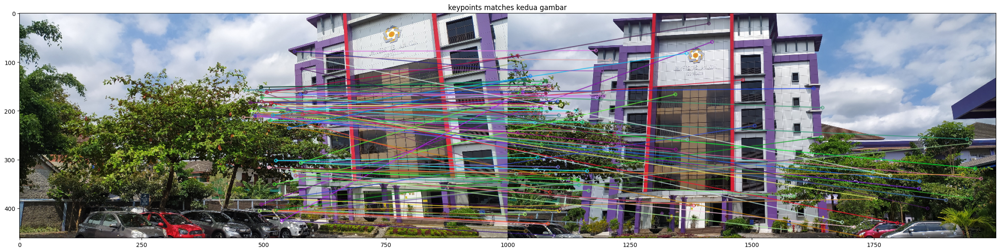

In [ ]:
#Melakukan Matching dari hasil deteksi keypoints menggunakan BruteForce Matcher
bf = cv2.BFMatcher()
matches = bf.knnMatch(des, des2, k=2)

#uji rasio Matching
good_and_second_good_match_list = []
for m in matches:
  if m[0].distance/m[1].distance<0.5:
    good_and_second_good_match_list.append(m)
good_match_arr = np.asarray(good_and_second_good_match_list)[:,0]

#hasil pencocokan
im_matches = cv2.drawMatchesKnn(rgb, kp, rgb2, kp2, good_and_second_good_match_list[0:60], None, flags=2)

plt.figure(figsize=(30,30))
plt.imshow(im_matches)
plt.title("keypoints matches kedua gambar")
plt.show()


In [ ]:

good_kp = np.array([kp[m.queryIdx].pt for m in good_match_arr])
good_kp2 = np.array([kp2[m.trainIdx].pt for m in good_match_arr])
H, masked = cv2.findHomography(good_kp2, good_kp, cv2.RANSAC, 5.0)

print(H)


[[ 3.89283353e-01  8.18627231e-02  4.26601103e+02]
 [-2.22175238e-01  8.09080708e-01  4.89110247e+01]
 [-6.03478804e-04 -1.62944728e-05  1.00000000e+00]]


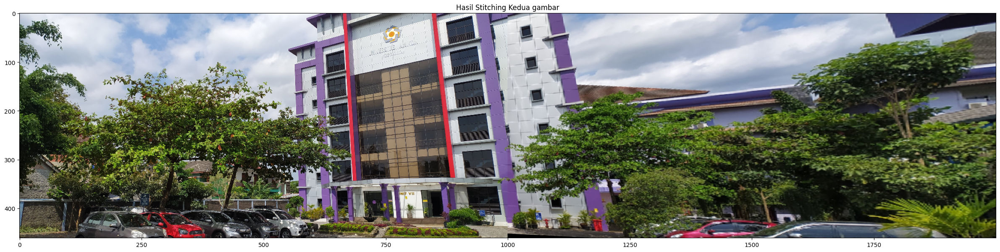

In [ ]:


rgb_r_warped = cv2.warpPerspective(rgb2, H, (rgb.shape[1]+ rgb2.shape[1], rgb.shape[0]))
rgb_r_warped[0:rgb.shape[0], 0:rgb.shape[1]] = rgb

plt.figure(figsize=(30,30))
plt.imshow(rgb_r_warped)
plt.title("Hasil Stitching Kedua gambar")
plt.show()